In [1]:
csv_path = 'CU-NYC-FIN-PT-08-2019-U-C/NYC_AIRBNB_LISTINGS.csv'

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.pandas
import plotly.express as px
from pathlib import Path

%matplotlib inline

In [3]:
pwd

'C:\\Users\\joshu\\Desktop\\gitstuff2'

In [5]:
df = pd.read_csv(csv_path)

In [6]:
df.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,zip_median_income,zip_median_home_value,est_monthly_income
0,15509,https://www.airbnb.com/rooms/15509,20181103152857,43408,Sleep at the CozySuite Sanctuary,Self catering lodging / vacation rental --fu...,We welcome travelers to CozySuite to sleep by ...,Self catering lodging / vacation rental --fu...,none,NaN,...,t,f,strict_14_with_grace_period,f,f,7,0.13,NaN,NaN,NaN
1,2515,https://www.airbnb.com/rooms/2515,20181103152857,43408,Stay at Chez Chic budget room #1,Step into our artistic spacious apartment and ...,-PLEASE BOOK DIRECTLY. NO NEED TO SEND A REQUE...,Step into our artistic spacious apartment and ...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,3,1.42,NaN,NaN,NaN
2,2539,https://www.airbnb.com/rooms/2539,20181103152857,43408,Clean & quiet apt home by the park,Renovated apt home in elevator building.,"Spacious, renovated, and clean apt home, one b...",Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,...,f,f,moderate,f,f,8,0.25,NaN,NaN,NaN
3,2595,https://www.airbnb.com/rooms/2595,20181103152857,43408,Skylit Midtown Castle,"Find your romantic getaway to this beautiful, ...","- Spacious (500+ft²), immaculate and nicely fu...","Find your romantic getaway to this beautiful, ...",none,Centrally located in the heart of Manhattan ju...,...,f,f,strict_14_with_grace_period,t,t,2,0.35,NaN,NaN,NaN
4,15729,https://www.airbnb.com/rooms/15729,20181103152857,43408,Village Green,NaN,Beautiful bedroom in a duplex house with large...,Beautiful bedroom in a duplex house with large...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,3,0.21,NaN,NaN,NaN


In [7]:
from uszipcode import Zipcode
from uszipcode import SearchEngine, SimpleZipcode, Zipcode
search = SearchEngine()

In [8]:
zipcode_list = []
median_home_value= []
median_household_income = []
for x in range(0,len(df)):
    latitude = df['latitude'][x] 
    longitude = df['longitude'][x]
    result = search.by_coordinates(latitude, longitude, radius=2)
    if len(result)>0:
        zipcode_list.append(result[0].zipcode)
        median_home_value.append(result[0].median_home_value)
        median_household_income.append(result[0].median_household_income)
    else:
        zipcode_list.append('0')
        median_home_value.append('0')
        median_household_income.append('0')
    

In [9]:
len(zipcode_list)

50968

In [10]:
count = 0
for x in zipcode_list:
    if x == '0':
        count += 1
print(count)

8


In [11]:
len(median_home_value)

50968

In [12]:
result[0]

SimpleZipcode(zipcode='10001', zipcode_type='Standard', major_city='New York', post_office_city='New York, NY', common_city_list=['New York'], county='New York County', state='NY', lat=40.75, lng=-73.99, timezone='Eastern', radius_in_miles=0.9090909090909091, area_code_list=['718', '917', '347', '646'], population=21102, population_density=33959.0, land_area_in_sqmi=0.62, water_area_in_sqmi=0.0, housing_units=12476, occupied_housing_units=11031, median_home_value=650200, median_household_income=81671, bounds_west=-74.008621, bounds_east=-73.984076, bounds_north=40.759731, bounds_south=40.743451)

In [13]:
df['zipcode_clean'] = zipcode_list
df['zip_median_income'] = median_household_income
df['zip_median_home_value'] = median_home_value

In [14]:
new_count = 0
for x in range(0,len(df)):
    if df['zipcode'][x] != df['zipcode_clean'][x]:
        new_count += 1


In [15]:
new_count

30666

In [16]:
neighborhood_count = df.groupby('neighbourhood_cleansed')['id'].count()

In [17]:
neighborhood_count.sort_values(ascending = False, inplace=True)
top50_count = neighborhood_count[:50]

In [18]:
neighborhood_count

neighbourhood_cleansed
Williamsburg                  4226
Bedford-Stuyvesant            3623
Harlem                        2830
Bushwick                      2525
Upper West Side               2218
Hell's Kitchen                2150
East Village                  2051
Upper East Side               1978
Midtown                       1743
Crown Heights                 1639
East Harlem                   1200
Chelsea                       1184
Greenpoint                    1177
Lower East Side                986
Astoria                        934
Washington Heights             914
West Village                   829
Flatbush                       655
Financial District             627
Clinton Hill                   606
Prospect-Lefferts Gardens      578
Long Island City               539
Park Slope                     536
Kips Bay                       517
Murray Hill                    515
Fort Greene                    463
Flushing                       433
Gramercy                       4

In [19]:
top50_count.hvplot.bar(rot = 70, height = 400 , width = 1000, title = "Top 50 Most Popular Neighborhoods for Airbnb Listings", ylabel = 'Number of Listings', xlabel ='Neighborhoods')

:Bars   [neighbourhood_cleansed]   (id)

In [20]:
borough_count = df.groupby('neighbourhood_group_cleansed')['id'].count()
borough_count.sort_values(ascending = False, inplace = True)

In [21]:
borough_count.hvplot.bar(title = 'Number of Airbnb Listings By Borough', ylabel = 'Numer of Listings', xlabel = 'Borough')

:Bars   [neighbourhood_group_cleansed]   (id)

In [22]:
zipcode_count = df.groupby('zipcode_clean')['id'].count()
zipcode_count.sort_values(ascending = False, inplace=True)
top50zips = zipcode_count[:50]

In [23]:
len(df.neighbourhood_cleansed.unique())

225

In [24]:
top50zips.hvplot.bar( rot = 70, title ="Top 50 NYC Zipcodes for Airbnb", xlabel = "Zipcode")

:Bars   [zipcode_clean]   (id)

In [49]:
MAPBOX_API_KEY="pk.eyJ1IjoienN0ZWluZGFtIiwiYSI6ImNrMTZ1dHk2MzBnd3gzaG84cHg1MHY1c3QifQ.T9TxpUzPsacqbAJmEZMkUA"
px.set_mapbox_access_token(MAPBOX_API_KEY)

In [26]:
#px.scatter_mapbox(df, lat="latitude", lon="longitude", color="room_type", zoom = 9)

In [27]:
borough_room_type = df.groupby(['neighbourhood_group_cleansed', 'room_type'])['id'].count()

In [28]:
borough_room_type

neighbourhood_group_cleansed  room_type      
Bronx                         Entire home/apt      332
                              Private room         630
                              Shared room           41
Brooklyn                      Entire home/apt     9616
                              Private room       10606
                              Shared room          401
Manhattan                     Entire home/apt    14496
                              Private room        8499
                              Shared room          496
Queens                        Entire home/apt     2007
                              Private room        3296
                              Shared room          214
Staten Island                 Entire home/apt      142
                              Private room         186
                              Shared room            6
Name: id, dtype: int64

In [29]:
borough_room_type.hvplot.bar(rot=90, height = 400, width = 1000, title = 'Airbnb Listings for Each Borough By Room Type', ylabel = 'Numer of Listings', xlabel = 'Borough, Room Type')

:Bars   [neighbourhood_group_cleansed,room_type]   (id)

In [30]:
boro_avg_price = df.groupby('neighbourhood_group_cleansed')['price'].mean()
boro_avg_price.sort_values(ascending = False, inplace = True)
boro_avg_price

neighbourhood_group_cleansed
Manhattan        192.904176
Staten Island    132.940120
Brooklyn         121.670610
Queens            97.243067
Bronx             86.035892
Name: price, dtype: float64

In [31]:
boro_avg_price.hvplot.bar(title = 'Avg Listing Price By Borough', xlabel = 'Borough' , ylabel = "Price $")

:Bars   [neighbourhood_group_cleansed]   (price)

In [32]:
neighborhood_avg_price = df.groupby('neighbourhood_cleansed')['price'].mean()
neighborhood_avg_price.sort_values(ascending = False, inplace = True)
top_expensive_neighborhoods = neighborhood_avg_price[:50]
top_expensive_neighborhoods

neighbourhood_cleansed
Fort Wadsworth            750.000000
Westerleigh               547.666667
Woodrow                   462.500000
Tribeca                   421.421053
Sea Gate                  400.200000
Riverdale                 348.375000
Randall Manor             339.894737
Flatiron District         326.212963
Battery Park City         287.805970
NoHo                      281.705882
Midtown                   280.593230
SoHo                      278.621212
West Village              265.940893
Greenwich Village         257.742925
Chelsea                   252.374155
Theater District          251.789062
Holliswood                250.666667
Neponsit                  249.500000
Willowbrook               249.000000
Todt Hill                 245.500000
St. George                243.888889
Whitestone                242.941176
Belle Harbor              239.500000
Chelsea, Staten Island    235.000000
Nolita                    217.461318
Murray Hill               216.561165
Financial Distr

In [33]:
top_expensive_neighborhoods.hvplot.bar(rot = 70, height = 400 , width = 1000, 
                                       title = "Top 50 Most Expensive Neighborhoods for Airbnb Listings", ylabel = 'Price$', xlabel ='Neighborhoods')

:Bars   [neighbourhood_cleansed]   (price)

In [34]:
zipcode_avg_price = df.groupby('zipcode_clean')['price'].mean()
zipcode_avg_price.sort_values(ascending = False, inplace = True)
top_expensive_zipcode = zipcode_avg_price[:50]
top_expensive_zipcode.hvplot.bar(title = "Top 50 Most Expensive Zipcodes for Airbnb Listings", height = 600, width = 1000, 
                                 ylabel = 'Price$', xlabel = 'Zipcode' ,rot = 70, ylim = (150, 440))

:Bars   [zipcode_clean]   (price)

In [35]:
zipcode_avg_price

zipcode_clean
10013    428.130081
10282    409.200000
10153    369.057143
10167    341.183486
11360    338.363636
10103    323.263780
10171    314.017241
10007    310.137500
10152    307.380952
10014    303.870036
10111    299.666667
10154    270.847619
10119    268.288660
10110    264.694444
10020    262.368421
10022    259.220930
10011    252.720613
10069    248.615385
11509    248.333333
10278    247.168103
10001    242.165121
10017    238.816223
10065    237.699725
10199    237.680723
10012    233.764266
11694    232.600000
10271    231.638743
10003    229.929550
10019    228.768889
11427    223.333333
            ...    
10462     76.783784
11373     76.646226
11433     76.500000
10468     76.021053
11223     75.500000
11004     75.000000
11419     74.696970
11416     73.260274
10472     73.080000
11426     72.857143
11429     72.222222
11359     72.000000
11411     71.848485
11369     70.494505
10455     70.074074
11581     69.043478
10460     68.866667
11436     68.719298
11421 

In [36]:
boro_neigh_avg_price = df.groupby(['neighbourhood_group_cleansed','neighbourhood_cleansed'] )['price'].mean()
boro_neigh_avg_price.sort_values(ascending = False, inplace = True)
top_expensive_boro_neigh = boro_neigh_avg_price[:50]
top_expensive_boro_neigh



neighbourhood_group_cleansed  neighbourhood_cleansed
Staten Island                 Fort Wadsworth            750.000000
                              Westerleigh               547.666667
                              Woodrow                   462.500000
Manhattan                     Tribeca                   421.421053
Brooklyn                      Sea Gate                  400.200000
Bronx                         Riverdale                 348.375000
Staten Island                 Randall Manor             339.894737
Manhattan                     Flatiron District         326.212963
                              Battery Park City         287.805970
                              NoHo                      281.705882
                              Midtown                   280.593230
                              SoHo                      278.621212
                              West Village              265.940893
                              Greenwich Village         257.742925
         

In [37]:
good_boros = ['Manhattan' , 'Brooklyn']

In [38]:
new_df = df.neighbourhood_group_cleansed.isin(good_boros)

In [39]:
df_not_si = df[df['neighbourhood_group_cleansed']!='Staten Island']

In [40]:
df_not_si.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,zip_median_income,zip_median_home_value,est_monthly_income
0,15509,https://www.airbnb.com/rooms/15509,20181103152857,43408,Sleep at the CozySuite Sanctuary,Self catering lodging / vacation rental --fu...,We welcome travelers to CozySuite to sleep by ...,Self catering lodging / vacation rental --fu...,none,NaN,...,t,f,strict_14_with_grace_period,f,f,7,0.13,39178,543800,NaN
1,2515,https://www.airbnb.com/rooms/2515,20181103152857,43408,Stay at Chez Chic budget room #1,Step into our artistic spacious apartment and ...,-PLEASE BOOK DIRECTLY. NO NEED TO SEND A REQUE...,Step into our artistic spacious apartment and ...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,3,1.42,43107,602400,NaN
2,2539,https://www.airbnb.com/rooms/2539,20181103152857,43408,Clean & quiet apt home by the park,Renovated apt home in elevator building.,"Spacious, renovated, and clean apt home, one b...",Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,...,f,f,moderate,f,f,8,0.25,52445,546300,NaN
3,2595,https://www.airbnb.com/rooms/2595,20181103152857,43408,Skylit Midtown Castle,"Find your romantic getaway to this beautiful, ...","- Spacious (500+ft²), immaculate and nicely fu...","Find your romantic getaway to this beautiful, ...",none,Centrally located in the heart of Manhattan ju...,...,f,f,strict_14_with_grace_period,t,t,2,0.35,None,None,NaN
4,15729,https://www.airbnb.com/rooms/15729,20181103152857,43408,Village Green,NaN,Beautiful bedroom in a duplex house with large...,Beautiful bedroom in a duplex house with large...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,3,0.21,78174,912000,NaN


In [41]:
zipcode_avg_price_not_si = df_not_si.groupby('zipcode_clean')['price'].mean()
zipcode_avg_price_not_si.sort_values(ascending = False, inplace = True)
top_expensive_zipcode_not_si = zipcode_avg_price_not_si[:50]
top_expensive_zipcode_not_si.hvplot.bar(title = "Top 50 Most Expensive Zipcodes for Airbnb Listings x SI", height = 600, width = 1000, 
                                 ylabel = 'Price$', xlabel = 'Zipcode' ,rot = 70, ylim = (150, 440))

:Bars   [zipcode_clean]   (price)

In [42]:
neighborhood_avg_price_not_si = df_not_si.groupby('neighbourhood_cleansed')['price'].mean()
neighborhood_avg_price_not_si.sort_values(ascending = False, inplace = True)
top_expensive_neighborhoods_not_si = neighborhood_avg_price_not_si[:50]
top_expensive_neighborhoods_not_si.hvplot.bar(rot = 70, height = 400 , width = 1000, 
                                       title = "Top 50 Most Expensive Neighborhoods for Airbnb Listings x SI", ylabel = 'Price$', xlabel ='Neighborhoods')

:Bars   [neighbourhood_cleansed]   (price)

In [43]:
smaller_csv = 'smaller_airbnb_data.csv'
df2 = pd.read_csv(smaller_csv)

In [44]:
df2.sort_values(by = 'price' , ascending = False, inplace = True)

In [45]:
df2.head()

,id,host_id,neighbourhood_cleansed,neighbourhood_group_cleansed,zipcode,latitude,longitude,price
21616,13894339,5143901,Greenpoint,Brooklyn,NaN,40.732596,-73.957388,10000
37514,22436899,72390391,Upper West Side,Manhattan,NaN,40.772131,-73.986647,10000
13148,8469166,9574884,East Harlem,Manhattan,NaN,40.793586,-73.941090,10000
10957,7003697,20582832,Astoria,Queens,NaN,40.768096,-73.916506,10000
7765,4737930,1235070,East Harlem,Manhattan,NaN,40.792645,-73.938976,9999


In [51]:
top_expensive = df2[:50]

In [52]:
#gmaps.configure(api_key='gmaps_api')

#locations = top_expensive[['latitude', 'longitude']] 
#weights = top_expensive['price'] 
#fig = gmaps.figure() 
#heatmap_layer = gmaps.heatmap_layer(locations, weights=weights) 
#fig.add_layer(heatmap_layer) 
#fig

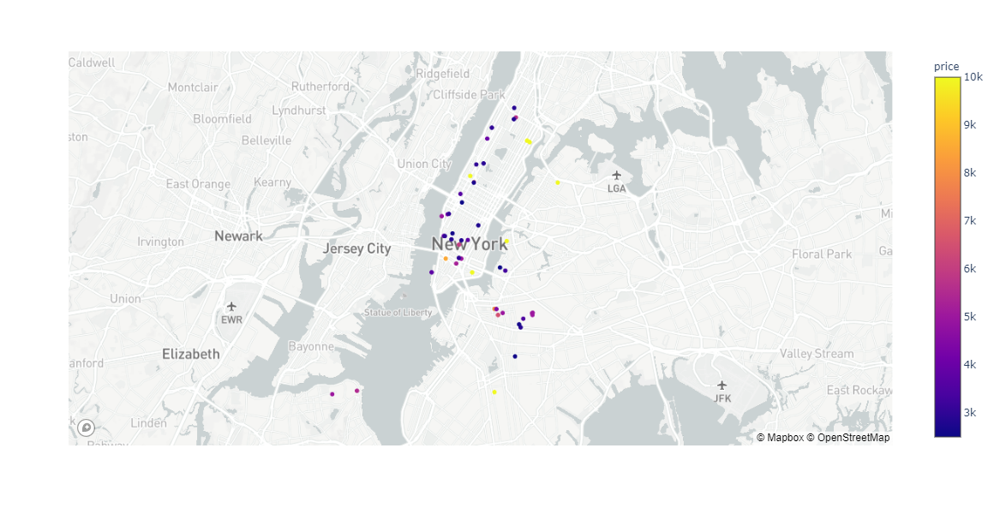

In [53]:
px.scatter_mapbox(top_expensive, lat="latitude", lon="longitude", color="price", zoom = 10,  )

In [50]:
df['zip_median_income'].head()
#df['zip_median_home_value']

0    39178
1    43107
2    52445
3     None
4    78174
Name: zip_median_income, dtype: object

In [51]:
df['zip_median_income'] = pd.to_numeric(df['zip_median_income'], errors='raise', downcast=None)
df['zip_median_home_value'] = pd.to_numeric(df['zip_median_home_value'], errors='raise', downcast=None)   
#df['zip_median_home_value'].astype('float64', inplace = True)

In [52]:
zipcode_income = df.groupby('zipcode_clean')['zip_median_income'].mean()
zipcode_income.sort_values(ascending = False, inplace = True)
top_income_zipcode = zipcode_income[:50]

In [53]:
zipcode_home_value = df.groupby('zipcode_clean')['zip_median_home_value'].mean()
zipcode_home_value.sort_values(ascending = False, inplace = True)
top_home_value_zipcode = zipcode_home_value[:50]

In [54]:
neighborhood_income = df.groupby('neighbourhood_cleansed')['zip_median_income'].mean()
neighborhood_income.sort_values(ascending = False, inplace = True)
top_income_neighborhood = neighborhood_income[:50]

In [55]:
neighborhood_hv = df.groupby('neighbourhood_cleansed')['zip_median_home_value'].mean()
neighborhood_hv.sort_values(ascending = False, inplace = True)
top_hv_neighborhood = neighborhood_hv[:50]

In [56]:
boro_income = df.groupby('neighbourhood_group_cleansed')['zip_median_income'].mean()
boro_income.sort_values(ascending = False, inplace = True)

In [57]:
boro_hv = df.groupby('neighbourhood_group_cleansed')['zip_median_home_value'].mean()
boro_hv.sort_values(ascending = False, inplace = True)

In [58]:
top_income_zipcode.hvplot.bar(height = 400, width = 1000, rot = 70, 
                              title = 'Top 50 NYC Zipcodes by Median Income', ylabel = 'Annual Income', xlabel = 'Zipcode' ).opts(yformatter = '$%.0f')

:Bars   [zipcode_clean]   (zip_median_income)

In [59]:
top_home_value_zipcode.hvplot.bar(height = 400, width = 1000, rot = 70, 
                              title = 'Top 50 NYC Zipcodes by Median Home Value', ylabel = 'Home Value', xlabel = 'Zipcode', ylim = (500000, 1000000) ).opts(yformatter = '$%.0f')

:Bars   [zipcode_clean]   (zip_median_home_value)

In [60]:
top_income_neighborhood.hvplot.bar(height = 400, width = 1000, rot = 70, 
                              title = 'Top 50 NYC Neighborhoods by Median Income', ylabel = 'Annual Income', xlabel = 'Zipcode', ylim = (70000, 180000) ).opts(yformatter = '$%.0f')

:Bars   [neighbourhood_cleansed]   (zip_median_income)

In [61]:
top_hv_neighborhood.hvplot.bar(height = 400, width = 1000, rot = 70, 
                              title = 'Top 50 NYC Neighborhoods by Median Home Value', ylabel = 'Home Value', xlabel = 'Zipcode', ylim = (600000, 1000000) ).opts(yformatter = '$%.0f')

:Bars   [neighbourhood_cleansed]   (zip_median_home_value)

In [62]:
boro_income.hvplot.bar(title = "NYC Median Income by Borough", ylabel = "Annual Income" , xlabel = 'Borough').opts(yformatter = '$%.0f')

:Bars   [neighbourhood_group_cleansed]   (zip_median_income)

In [63]:
boro_hv.hvplot.bar(title = "NYC Median Home Value by Borough", ylabel = "Home Value" , xlabel = 'Borough').opts(yformatter = '$%.0f')

:Bars   [neighbourhood_group_cleansed]   (zip_median_home_value)

In [86]:
df.sort_values(by = 'zip_median_income' , ascending = False, inplace = True)

In [87]:
top_listings_income = df

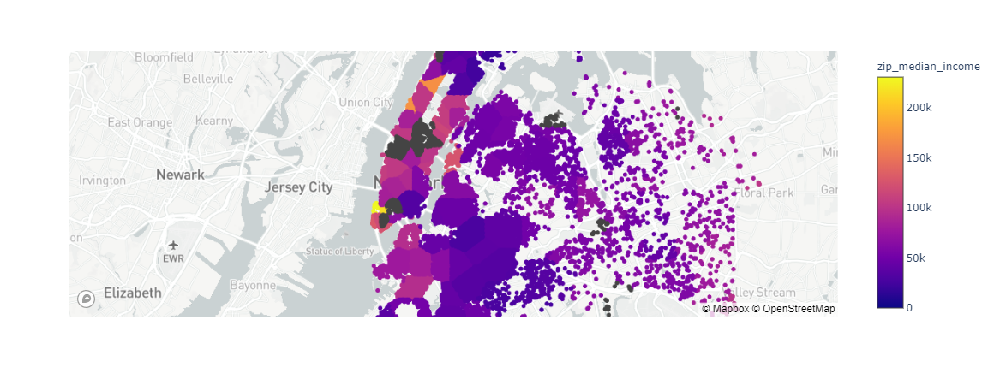

In [88]:
px.scatter_mapbox(top_listings_income, lat="latitude", lon="longitude", color="zip_median_income", zoom = 10)

In [89]:
df.sort_values(by = 'zip_median_home_value' , ascending = False, inplace = True)
top_listings_hv = df

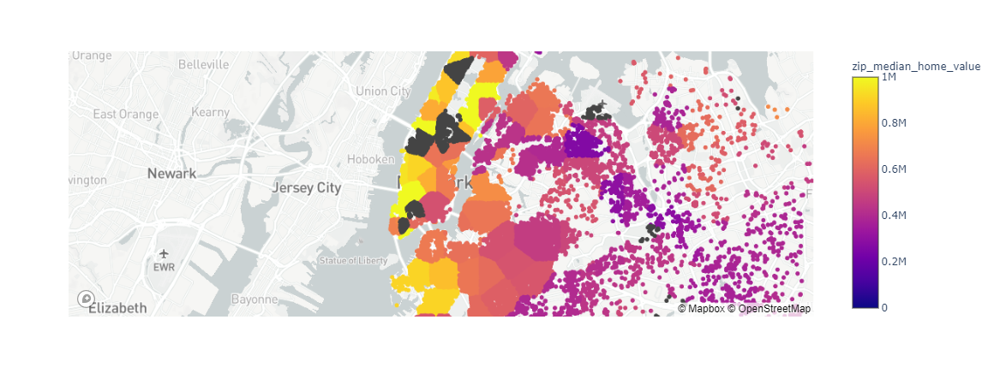

In [90]:
px.scatter_mapbox(top_listings_hv, lat="latitude", lon="longitude", color="zip_median_home_value", zoom = 10)

In [64]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [65]:
text = " ".join(review for review in df['description'])

wordcloud = WordCloud().generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

TypeError: sequence item 34: expected str instance, float found

In [66]:
wordcloud_df = df['description'].astype('str')

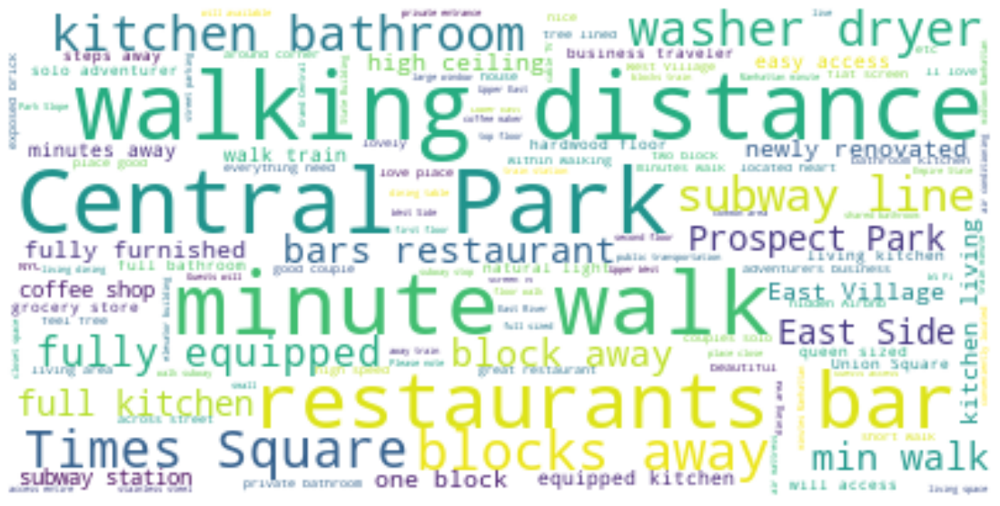

In [67]:
text = " ".join(review for review in wordcloud_df)
stopwords = set(STOPWORDS)
stopwords.update(["size", "bed", "room", "bedroom", "apartment", "size bed", "New York", "New", "York", "apt", "bedroom apartment", "well", "block away"])

wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)



# Display the generated image:
plt.figure(figsize=[20,10])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [90]:
df.sort_values(by = 'price' , ascending = False, inplace = True)

In [91]:
top_10_listings = df[:10]

In [92]:
wordcloud_top_df = top_10_listings['description'].astype('str')

In [94]:
wordcloud_top_df

21616    Our luxury 1 bedroom comfortably fits 3 guests...
37514    One bedroom, great neighborhood, steps away fr...
13148    NOT AVAILABLE NOT AVAILABLE NOT AVAILABLE NOT ...
10957    1 room with a twin bed in a 2 bedroom apartmen...
7765     4 minute walk the 6 train. 2 bedroom, 1 bathro...
14848    This private room is clean, bright, comfortabl...
8225     This amazing apartment is in a safe, hip Brook...
39068    The perfect apt in NYC. At the intersection of...
5204     RATES Parlor floor only  living room, den, din...
4454     Fantastic Duplex Apt in a Townhouse in one of ...
Name: description, dtype: object

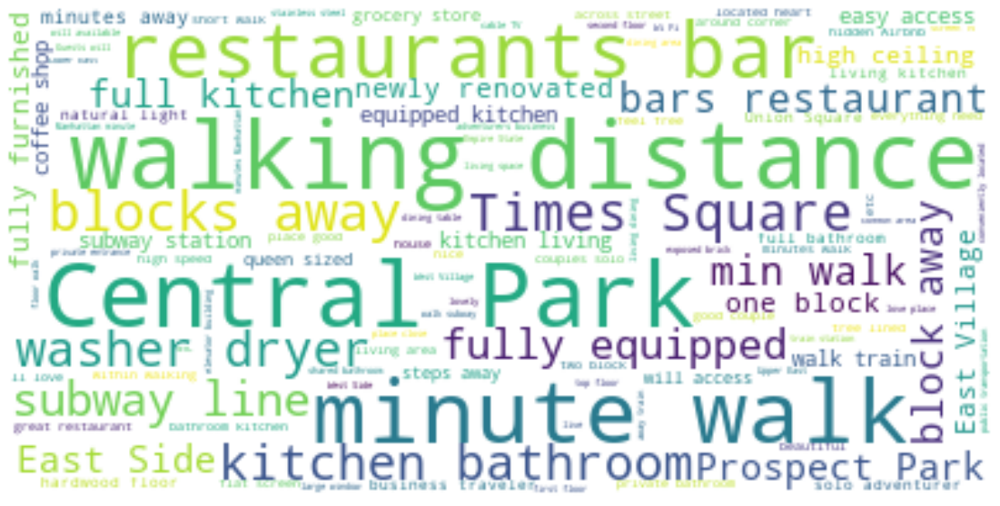

In [93]:
text2 = " ".join(review for review in wordcloud_top_df)
stopwords = set(STOPWORDS)
stopwords.update(["size", "bed", "room", "bedroom", "apartment", "size bed", "New York", "New", "York", "apt", "bedroom apartment", "well", "block away"])

wordcloud2 = WordCloud(stopwords=stopwords, background_color="white").generate(text)



# Display the generated image:
plt.figure(figsize=[20,10])
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

In [42]:
#avg_stay = 6.4
#review_multiplier = 2
#est_avg_monthly_income = []

#for x in range(0,len(df)):
#    if df['minimum_nights'][x] < avg_stay:
#        est_avg_monthly_income.append((df['reviews_per_month'][x] * 2) * (6.4 * df['price'][x]))
#    else:
#        est_avg_monthly_income.append((df['reviews_per_month'][x] * 2) * (df['minimum_nights'][x] * df['price'][x]))
    


In [43]:
#est_avg_monthly_income[:10]

[98.17600000000002,
 1072.384,
 476.8,
 1007.9999999999999,
 239.232,
 295.68,
 15792.0,
 nan,
 4955.5199999999995,
 192.5]

In [44]:
#df['est_monthly_income'] = est_avg_monthly_income

In [45]:
#neigh_avg_inc = df.groupby('neighbourhood_cleansed')['est_monthly_income'].mean()

In [46]:
#zip_avg_inc = df.groupby('zipcode_clean')['est_monthly_income'].mean()

In [47]:
#zip_avg_inc.sort_values( ascending = False, inplace = True)

In [99]:
#zip_avg_inc    10013    4489.000000

In [67]:
#income_sort = df.sort_values(by = 'est_monthly_income', ascending = False, inplace = True)
#new_df=df[(df['borough']=='Manhattan') | (df['borough'] == 'Brooklyn')]
#px.scatter_mapbox(top_income_sort, lat="latitude", lon="longitude", color="est_monthly_income", zoom = 10)

In [100]:
#df.head()

In [101]:
zipcode_avg_price.to_pickle('zipcode_airbnb_avg_price.pkl')

In [40]:
pwd

'C:\\Users\\joshu\\Desktop\\gitstuff2'

In [76]:
neighborhood_ratings = df_not_si.groupby('neighbourhood_cleansed')['review_scores_rating'].mean()
neighborhood_ratings.sort_values(ascending = False, inplace = True)
top_ratings_neighborhood = neighborhood_ratings[:50]
bottom_ratings_neighborhood = neighborhood_ratings[-50:]

In [75]:
zipcode_ratings = df_not_si.groupby('zipcode_clean')['review_scores_rating'].mean()
zipcode_ratings.sort_values(ascending = False, inplace = True)
top_ratings_zipcode = zipcode_ratings[:50]
bottom_ratings_zipcode = zipcode_ratings[-50:]

In [98]:
top_ratings_neighborhood.hvplot.bar(rot= 70, ylim = (90,100), title ="Top 50 Review Score Neighborhoods")

:Bars   [neighbourhood_cleansed]   (review_scores_rating)

In [99]:
bottom_ratings_neighborhood.hvplot.bar(rot=70, ylim=(80,95),  title ="Bottom 50 Review Score Neighborhoods")

:Bars   [neighbourhood_cleansed]   (review_scores_rating)

In [86]:
neighborhood_ratings['Tribeca']

94.43697478991596

In [88]:
top_ratings_zipcode.hvplot.bar(rot= 70, ylim = (93,100))

:Bars   [zipcode_clean]   (review_scores_rating)

In [89]:
bottom_ratings_zipcode.hvplot.bar(rot=70, ylim=(80,95))

:Bars   [zipcode_clean]   (review_scores_rating)

In [100]:
top_ratings_neighborhood

neighbourhood_cleansed
Sea Gate              100.000000
Glen Oaks             100.000000
Breezy Point          100.000000
Morris Park            99.538462
Jamaica Hills          99.500000
Castle Hill            99.333333
Neponsit               98.500000
Douglaston             97.888889
Bath Beach             97.785714
Belle Harbor           97.500000
Howard Beach           97.384615
Throgs Neck            97.307692
Pelham Gardens         97.260870
Westchester Square     97.200000
Navy Yard              97.000000
Schuylerville          96.800000
Eastchester            96.666667
Olinville              96.500000
Little Neck            96.500000
Pelham Bay             96.333333
City Island            96.333333
Edenwald               96.200000
Cobble Hill            96.108696
Brooklyn Heights       96.102564
Boerum Hill            96.030488
North Riverdale        96.000000
Edgemere               96.000000
South Slope            95.954357
College Point          95.923077
Vinegar Hill        

In [106]:
cheapest50_neigh_not_sit = neighborhood_avg_price_not_si[-100:]
cheapest50_neigh_not_sit

neighbourhood_cleansed
Crown Heights                104.929835
College Point                103.937500
Prospect-Lefferts Gardens    103.505190
North Riverdale              103.375000
Middle Village               102.576923
Bay Ridge                    102.220690
Edgemere                     101.888889
Manhattan Beach              100.333333
Co-op City                    99.142857
Far Rockaway                  98.928571
Van Nest                      98.437500
Wakefield                     98.357143
Canarsie                      98.176923
Pelham Bay                    98.000000
Howard Beach                  97.722222
St. Albans                    97.409091
Fort Hamilton                 97.100000
Ditmars Steinway              96.700855
Marble Hill                   96.666667
Edenwald                      96.600000
Williamsbridge                96.424242
Clason Point                  95.100000
Mill Basin                    95.000000
Queens Village                94.777778
Mott Haven       

In [107]:
best_of_both_worlds = pd.concat([cheapest50_neigh_not_sit,top_ratings_neighborhood], axis='columns',join = 'inner')

In [108]:
best_of_both_worlds

,price,review_scores_rating
neighbourhood_cleansed,,
College Point,103.937500,95.923077
North Riverdale,103.375000,96.000000
Edgemere,101.888889,96.000000
Co-op City,99.142857,95.333333
Far Rockaway,98.928571,94.944444
Pelham Bay,98.000000,96.333333
Howard Beach,97.722222,97.384615
Edenwald,96.600000,96.200000
Williamsbridge,96.424242,95.521739


In [55]:
df_not_si_not_bronx = df_not_si[df_not_si['neighbourhood_group_cleansed']!='Bronx']

In [56]:
df_not_si_not_bronx_not_queens= df_not_si_not_bronx[df_not_si_not_bronx['neighbourhood_group_cleansed']!='Queens']

In [100]:
manh_bk_ratings = df_not_si_not_bronx_not_queens.groupby('neighbourhood_cleansed')['review_scores_rating'].mean()
manh_bk_ratings.sort_values(ascending = False, inplace = True)
manh_bk_ratings


neighbourhood_cleansed
Sea Gate              100.000000
Bath Beach             97.785714
Navy Yard              97.000000
Cobble Hill            96.108696
Brooklyn Heights       96.102564
Boerum Hill            96.030488
South Slope            95.954357
Vinegar Hill           95.863636
Fort Greene            95.839674
Prospect Heights       95.647619
Windsor Terrace        95.455882
Clinton Hill           95.443299
Greenpoint             95.234184
Red Hook               95.200000
Park Slope             95.122066
Gerritsen Beach        95.000000
Sheepshead Bay         94.927835
Marble Hill            94.900000
Carroll Gardens        94.752577
Nolita                 94.729958
Downtown Brooklyn      94.693548
Mill Basin             94.666667
Williamsburg           94.664752
Two Bridges            94.618182
Columbia St            94.600000
Bay Ridge              94.567568
Flatbush               94.559761
Civic Center           94.558140
West Village           94.550769
Tribeca             

In [101]:
manh_bk_ratings.hvplot.bar(rot = 70, width = 1000,height= 400, ylim = (85,100), title = 'Neighborhoods By Review Score - Manhattan and Brooklyn')

:Bars   [neighbourhood_cleansed]   (review_scores_rating)

In [72]:
manh_bk_price = df_not_si_not_bronx_not_queens.groupby('neighbourhood_cleansed')['price'].mean()
manh_bk_price.sort_values(ascending = False, inplace = True)
manh_bk_price

neighbourhood_cleansed
Tribeca                      421.421053
Sea Gate                     400.200000
Flatiron District            326.212963
Battery Park City            287.805970
NoHo                         281.705882
Midtown                      280.593230
SoHo                         278.621212
West Village                 265.940893
Greenwich Village            257.742925
Chelsea                      252.374155
Theater District             251.789062
Nolita                       217.461318
Murray Hill                  216.561165
Financial District           209.033493
Gramercy                     207.566125
Hell's Kitchen               206.999535
Little Italy                 204.468085
Kips Bay                     204.214700
Upper West Side              198.241659
Brooklyn Heights             197.851351
DUMBO                        192.358974
Clinton Hill                 188.859736
East Village                 185.334959
Civic Center                 181.735294
Boerum Hill      

In [88]:
best_of_both_worlds_manh_bk = pd.concat([manh_bk_price,manh_bk_ratings], axis = 'columns', join = 'inner')
best_of_both_worlds_manh_bk.reset_index(inplace=True)

In [89]:
best_of_both_worlds_manh_bk.hvplot.scatter( y ='price', x = 'review_scores_rating', ylim = (50,450), xlim = (86,100), hover_cols =['neighbourhood_cleansed'])

:Scatter   [review_scores_rating]   (price,neighbourhood_cleansed)

In [95]:
top_best_of_both_worlds_manh_bk = best_of_both_worlds_manh_bk[best_of_both_worlds_manh_bk['price']<200]

In [96]:
final_top_best_of_both_worlds_manh_bk = top_best_of_both_worlds_manh_bk[top_best_of_both_worlds_manh_bk['review_scores_rating']>95]

In [97]:
final_top_best_of_both_worlds_manh_bk

,neighbourhood_cleansed,price,review_scores_rating
19,Brooklyn Heights,197.851351,96.102564
21,Clinton Hill,188.859736,95.443299
24,Boerum Hill,179.292079,96.030488
26,Cobble Hill,178.000000,96.108696
30,Park Slope,165.606343,95.122066
33,Vinegar Hill,160.060606,95.863636
36,Red Hook,152.586667,95.200000
37,Fort Greene,149.900648,95.839674
38,South Slope,147.382759,95.954357
40,Navy Yard,142.166667,97.000000


In [102]:
worst_of_both_worlds = best_of_both_worlds_manh_bk[best_of_both_worlds_manh_bk['price']>250]

In [103]:
final_worst_of_both_worlds = worst_of_both_worlds[worst_of_both_worlds['review_scores_rating']<95]

In [104]:
final_worst_of_both_worlds

,neighbourhood_cleansed,price,review_scores_rating
0,Tribeca,421.421053,94.436975
2,Flatiron District,326.212963,92.615385
3,Battery Park City,287.805970,92.108108
4,NoHo,281.705882,93.523077
5,Midtown,280.593230,92.178344
6,SoHo,278.621212,94.023490
7,West Village,265.940893,94.550769
8,Greenwich Village,257.742925,93.784375
9,Chelsea,252.374155,94.214922
10,Theater District,251.789062,93.612676
